<a href="https://colab.research.google.com/github/shishir-sh26/port/blob/main/lstm_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/jjjjjj/drive-download-20250911T191148Z-1-002/Sunny/Common_Iora/Common_Iora_137_004_001.npy
/kaggle/input/jjjjjj/drive-download-20250911T191148Z-1-002/Sunny/Common_Iora/Common_Iora_193_003_001.npy
/kaggle/input/jjjjjj/drive-download-20250911T191148Z-1-002/Sunny/Common_Iora/Common_Iora_167_002_001.npy
/kaggle/input/jjjjjj/drive-download-20250911T191148Z-1-002/Sunny/Common_Iora/Common_Iora_132_006_001.npy
/kaggle/input/jjjjjj/drive-download-20250911T191148Z-1-002/Sunny/Common_Iora/Common_Iora_199_006_001.npy
/kaggle/input/jjjjjj/drive-download-20250911T191148Z-1-002/Sunny/Common_Iora/Common_Iora_166_002_001.npy
/kaggle/input/jjjjjj/drive-download-20250911T191148Z-1-002/Sunny/Common_Iora/Common_Iora_185_002_001.npy
/kaggle/input/jjjjjj/drive-download-20250911T191148Z-1-002/Sunny/Common_Iora/Common_Iora_137_001_001.npy
/kaggle/input/jjjjjj/drive-download-20250911T191148Z-1-002/Sunny/Common_Iora/Common_Iora_189_003_001.npy
/kaggle/input/jjjjjj/drive-download-20250911T191148Z-1-

Using dataset root(s): ['/kaggle/input/jjjjjj/drive-download-20250911T191148Z-1-001', '/kaggle/input/jjjjjj/drive-download-20250911T191148Z-1-002']
✅ Dataset initialized with 100161 valid samples
Dataset sizes -> train: 80128, val: 20033
Epoch 1/30 | Train 1.4480/0.3833 | Val 1.3854/0.4174
✅ Saved best model
Epoch 2/30 | Train 1.3444/0.4388 | Val 1.3186/0.4553
✅ Saved best model
Epoch 3/30 | Train 1.2874/0.4695 | Val 1.2800/0.4709
✅ Saved best model
Epoch 4/30 | Train 1.2360/0.4959 | Val 1.2231/0.5061
✅ Saved best model
Epoch 5/30 | Train 1.1842/0.5197 | Val 1.2050/0.5132
✅ Saved best model
Epoch 6/30 | Train 1.1414/0.5426 | Val 1.1767/0.5259
✅ Saved best model
Epoch 7/30 | Train 1.0957/0.5648 | Val 1.1560/0.5418
✅ Saved best model
Epoch 8/30 | Train 1.0526/0.5843 | Val 1.1479/0.5454
✅ Saved best model
Epoch 9/30 | Train 1.0131/0.6024 | Val 1.1534/0.5421
Epoch 10/30 | Train 0.9762/0.6197 | Val 1.1564/0.5521
✅ Saved best model
Epoch 11/30 | Train 0.9356/0.6374 | Val 1.1684/0.5567
✅ Save

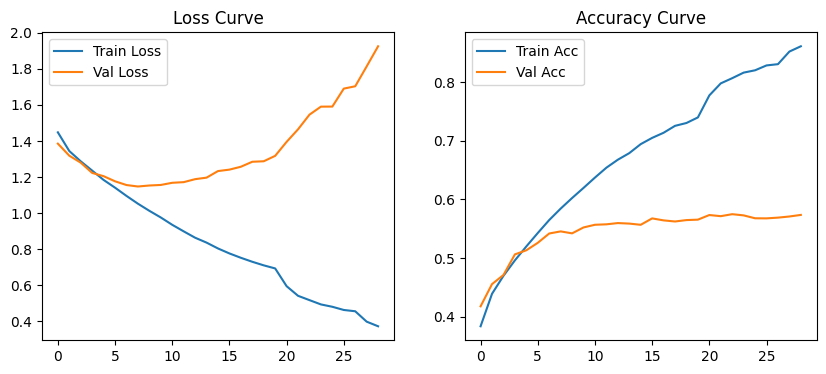

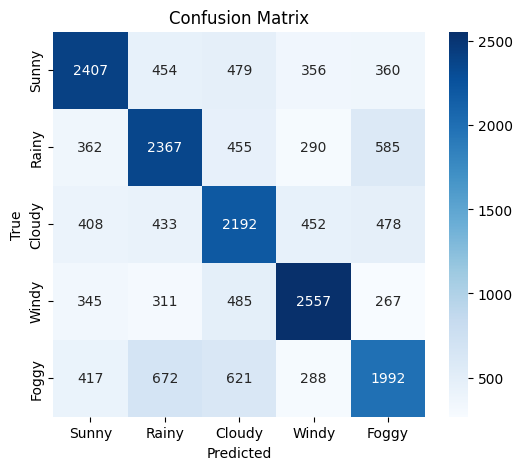

              precision    recall  f1-score   support

       Sunny     0.6111    0.5934    0.6021      4056
       Rainy     0.5586    0.5831    0.5706      4059
      Cloudy     0.5180    0.5531    0.5350      3963
       Windy     0.6485    0.6449    0.6467      3965
       Foggy     0.5410    0.4992    0.5193      3990

    accuracy                         0.5748     20033
   macro avg     0.5754    0.5748    0.5747     20033
weighted avg     0.5755    0.5748    0.5748     20033



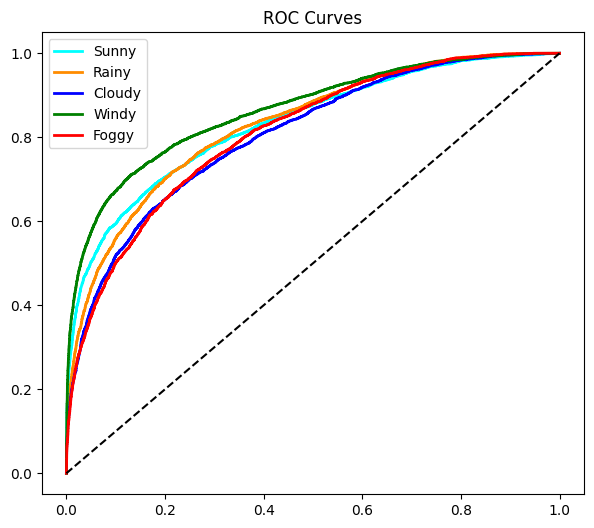

All done. Artifacts saved to: ./training_outputs_lstm


In [ ]:
# ==========================================================
# LSTM Training on Bird Weather Dataset (CPU Optimized)
# ==========================================================
import os, time, random, json
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import cycle

# -----------------------------
# Candidate dataset root dirs
# -----------------------------
CANDIDATE_BASE_DIRS = [
    "/kaggle/input/jjjjjj/drive-download-20250911T191148Z-1-001",
    "/kaggle/input/jjjjjj/drive-download-20250911T191148Z-1-002",
    "/kaggle/working/dataset-001",
    "/kaggle/working/dataset-002",
    "/content/drive/MyDrive/Avianweathernet2/robust_features_final",
    "/content/robust_features_final"
]

classes = ["Sunny", "Rainy", "Cloudy", "Windy", "Foggy"]
class_to_idx = {c:i for i,c in enumerate(classes)}
class_names = classes

# -----------------------------
# Hyperparameters
# -----------------------------
SEED = 42
BATCH_SIZE = 32            # smaller for CPU
EPOCHS = 30
DEVICE = torch.device("cpu")  # force CPU
EARLY_STOPPING_PATIENCE = 6
SAVE_DIR = "./training_outputs_lstm"
os.makedirs(SAVE_DIR, exist_ok=True)

# -----------------------------
# Reproducibility
# -----------------------------
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# -----------------------------
# Helper: pick base dirs that exist
# -----------------------------
base_dirs = [d for d in CANDIDATE_BASE_DIRS if os.path.exists(d)]
if len(base_dirs) == 0:
    print("❌ No dataset found. Please update paths.")
    raise RuntimeError("Dataset not found.")
print("Using dataset root(s):", base_dirs)

# =============================
# 1. Dataset
# =============================
class MFCCDataset(Dataset):
    def __init__(self, base_dirs, classes, augment=False):
        self.samples = []
        self.class_to_idx = {c:i for i,c in enumerate(classes)}
        self.augment = augment
        self.skipped = {c:0 for c in classes}

        for bdir in base_dirs:
            for label in classes:
                d = os.path.join(bdir, label)
                if not os.path.exists(d):
                    continue
                for root, _, files in os.walk(d):
                    for fname in files:
                        if not fname.lower().endswith(".npy"):
                            continue
                        path = os.path.join(root, fname)
                        try:
                            arr = np.load(path, mmap_mode="r")
                            if arr.size == 0 or arr.ndim < 2:
                                self.skipped[label] += 1
                                continue
                        except Exception:
                            self.skipped[label] += 1
                            continue
                        self.samples.append((path, self.class_to_idx[label]))

        total_valid = len(self.samples)
        print(f"✅ Dataset initialized with {total_valid} valid samples")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        try:
            x = np.load(path).astype(np.float32)  # expected (3, 13, 100)
            if x.ndim == 2:
                x = np.stack([x, x, x], axis=0).astype(np.float32)
            elif x.ndim == 4 and x.shape[0] == 1:
                x = x.squeeze(0).astype(np.float32)
            # Pad/truncate to (3,13,100)
            target_shape = (3, 13, 100)
            if x.shape != target_shape:
                out = np.zeros(target_shape, dtype=np.float32)
                min_c, min_f, min_t = min(x.shape[0],3), min(x.shape[1],13), min(x.shape[2],100)
                out[:min_c,:min_f,:min_t] = x[:min_c,:min_f,:min_t]
                x = out
        except Exception:
            x = np.zeros((3, 13, 100), dtype=np.float32)

        if self.augment:
            x = x + np.random.normal(0,0.01,x.shape).astype(np.float32)
            shift = np.random.randint(-5,6)
            if shift != 0:
                x = np.roll(x, shift, axis=2)

        # For LSTM: reshape to (time, features)
        x = np.transpose(x, (2,0,1))   # (100, 3, 13)
        x = x.reshape(100, -1)         # (100, 39)

        return torch.tensor(x, dtype=torch.float32), label

dataset = MFCCDataset(base_dirs, classes, augment=True)
if len(dataset) == 0:
    raise RuntimeError("❌ No valid .npy files found.")

# Train/val split
n_total = len(dataset)
n_train = int(0.8 * n_total)
n_val = n_total - n_train
train_set, val_set = random_split(dataset, [n_train, n_val], generator=torch.Generator().manual_seed(SEED))
val_set.dataset.augment = False

# Dataloaders (CPU safe)
def make_dataloaders(train_set, val_set, batch_size):
    train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True,
                              num_workers=0, pin_memory=False)
    val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=False,
                            num_workers=0, pin_memory=False)
    return train_loader, val_loader

train_loader, val_loader = make_dataloaders(train_set, val_set, BATCH_SIZE)
print(f"Dataset sizes -> train: {len(train_set)}, val: {len(val_set)}")

# =============================
# 2. LSTM Model
# =============================
class LSTMModel(nn.Module):
    def __init__(self, input_dim=39, hidden_dim=128, num_layers=2, num_classes=5):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers=num_layers,
                            batch_first=True, bidirectional=True)
        self.dropout = nn.Dropout(0.5)
        self.fc = nn.Linear(hidden_dim*2, num_classes)

    def forward(self,x):
        out,_ = self.lstm(x)   # (B,T,H*2)
        out = out[:,-1,:]      # last time step
        return self.fc(self.dropout(out))

model = LSTMModel(num_classes=len(class_names)).to(DEVICE)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="max", factor=0.5, patience=3)

# =============================
# 3. Evaluation
# =============================
def evaluate(model, loader):
    model.eval()
    total, correct, loss_sum = 0,0,0
    all_preds, all_true, all_probs = [],[],[]
    with torch.no_grad():
        for xb,yb in loader:
            xb,yb = xb.to(DEVICE), yb.to(DEVICE)
            out = model(xb)
            loss = criterion(out,yb)
            loss_sum += loss.item()*yb.size(0)
            preds = out.argmax(1)
            probs = torch.softmax(out,dim=1)
            total += yb.size(0)
            correct += (preds==yb).sum().item()
            all_preds.extend(preds.cpu().numpy())
            all_true.extend(yb.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    return loss_sum/total, correct/total, np.array(all_preds), np.array(all_true), np.array(all_probs)

# =============================
# 4. Training Loop
# =============================
best_acc, wait, best_epoch = 0,0,0
history, start = [], time.time()

for epoch in range(1, EPOCHS+1):
    model.train()
    epoch_loss, correct, total = 0,0,0
    for xb,yb in train_loader:
        xb,yb = xb.to(DEVICE), yb.to(DEVICE)
        optimizer.zero_grad()
        out = model(xb)
        loss = criterion(out,yb)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()*yb.size(0)
        correct += (out.argmax(1)==yb).sum().item()
        total += yb.size(0)

    train_loss, train_acc = epoch_loss/total, correct/total
    val_loss,val_acc,val_preds,val_true,val_probs = evaluate(model,val_loader)
    scheduler.step(val_acc)
    history.append((train_loss,train_acc,val_loss,val_acc))
    print(f"Epoch {epoch}/{EPOCHS} | Train {train_loss:.4f}/{train_acc:.4f} | Val {val_loss:.4f}/{val_acc:.4f}")

    if val_acc>best_acc:
        best_acc,best_epoch,wait = val_acc, epoch, 0
        torch.save(model.state_dict(), os.path.join(SAVE_DIR,"best_lstm.pt"))
        print("✅ Saved best model")
    else:
        wait += 1

    if wait >= EARLY_STOPPING_PATIENCE:
        print("⏹ Early stopping"); break

torch.save(model.state_dict(), os.path.join(SAVE_DIR,"final_lstm.pt"))
print(f"Training done in {(time.time()-start)/60:.2f} min. Best acc {best_acc:.4f} @ epoch {best_epoch}")

# =============================
# 5. Evaluation + Plots
# =============================
best_model = LSTMModel(num_classes=len(class_names)).to(DEVICE)
best_model.load_state_dict(torch.load(os.path.join(SAVE_DIR,"best_lstm.pt"), map_location=DEVICE))
val_loss,val_acc,val_preds,val_true,val_probs = evaluate(best_model,val_loader)
print(f"Best model -> Val Loss {val_loss:.4f}, Val Acc {val_acc:.4f}")

history = np.array(history)
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.plot(history[:,0],label="Train Loss"); plt.plot(history[:,2],label="Val Loss"); plt.legend(); plt.title("Loss Curve")
plt.subplot(1,2,2)
plt.plot(history[:,1],label="Train Acc"); plt.plot(history[:,3],label="Val Acc"); plt.legend(); plt.title("Accuracy Curve")
plt.show()

cm = confusion_matrix(val_true, val_preds)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Confusion Matrix"); plt.show()

print(classification_report(val_true, val_preds, target_names=class_names, digits=4))

y_true_bin = label_binarize(val_true, classes=np.arange(len(class_names)))
plt.figure(figsize=(7,6))
for i,color in zip(range(len(class_names)), cycle(["aqua","darkorange","blue","green","red"])):
    try:
        fpr,tpr,_ = roc_curve(y_true_bin[:,i], val_probs[:,i])
        plt.plot(fpr, tpr, color=color, lw=2, label=f"{class_names[i]}")
    except Exception:
        continue
plt.plot([0,1],[0,1],"k--"); plt.legend(); plt.title("ROC Curves"); plt.show()

metrics = {
    "best_val_loss": float(val_loss),
    "best_val_acc": float(val_acc),
    "best_epoch": int(best_epoch),
    "train_samples": len(train_set),
    "val_samples": len(val_set)
}
with open(os.path.join(SAVE_DIR,"training_metrics.json"), "w") as f:
    json.dump(metrics, f, indent=2)

print("All done. Artifacts saved to:", SAVE_DIR)
